# Import packages and data 

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.stats
import anndata
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
# Set up the plot config for viewing the annotation clearly.
sc.settings.set_figure_params(dpi=120, dpi_save=1000)
sc.logging.print_versions()

scanpy==1.4.4 anndata==0.6.22.post1 umap==0.3.7 numpy==1.15.4 scipy==1.3.0 pandas==0.23.4 scikit-learn==0.20.2 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
adata = sc.read('/Users/b8058304/Documents/PhD_work/Coding/ys/data/YS_data_YS_paper_post_scrub.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 127083 × 26661 
    obs: 'n_genes', 'n_counts', 'orig_ident', 'percent_mito', 'fetal_ids', 'sort_ids', 'tissue', 'lanes', 'stages', 'sample_type', 'gender', 'AnnatomicalPart', 'res_30', 'LouvainClustering', 'fullmeta', 'short_code', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'oldanno', 'leiden', 'leiden_sub', 'Hep', 'subcluster_annotation', 'oldanno_2', 'Component', 'cell_labels', 'refined_cell_labels', 'cell.labels', 'fibro_subset'
    var: 'gene.mean', 'gene.dispersion', 'gene.dispersion.scaled'
    uns: 'cell.labels_colors', 'fibro_subset_colors', 'leiden', 'neighbors', 'refined_cell_labels_colors'
    obsm: 'X_fdg', 'X_harmony', 'X_orig.pca', 'X_pca', 'X_pca_prev_1', 'X_tsne', 'X_umap'

# Rename hepatocyte to hepatoid

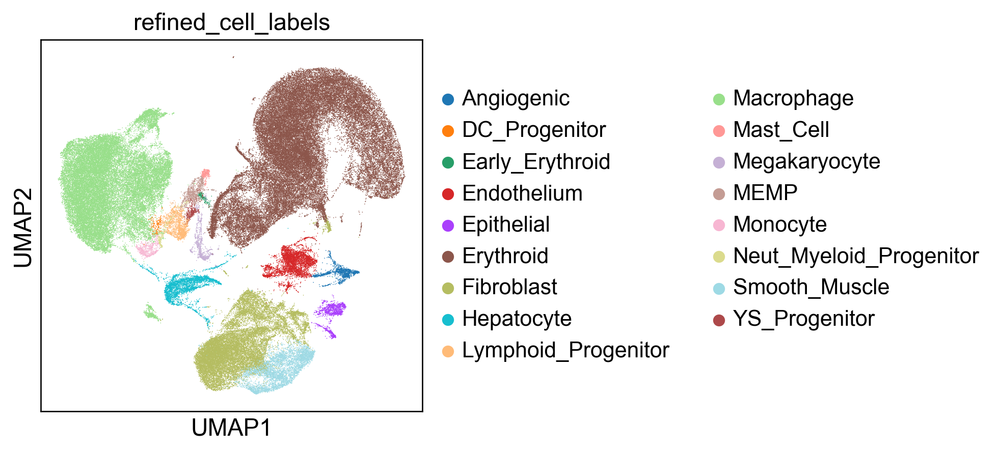

In [5]:
sc.pl.umap(adata, color="refined_cell_labels")

In [6]:
adata.obs["cell.labels"] = adata.obs["refined_cell_labels"]

In [7]:
adata.obs["cell.labels"] = adata.obs["cell.labels"].replace("Hepatocyte", "Hepatoid")

In [8]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 19194
Hepatoid                    3447
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34925
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     577
Neut_Myeloid_Progenitor      229
Smooth_Muscle               5188
YS_Progenitor                411
dtype: int64

... storing 'cell.labels' as categorical


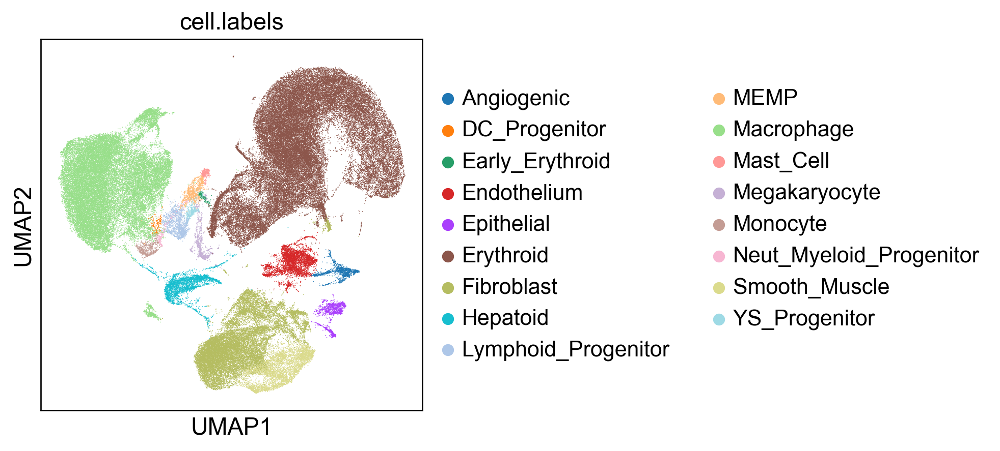

In [9]:
sc.pl.umap(adata, color="cell.labels")

# Reset adata.X to raw

In [10]:
adata.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [11]:
adata.X.max()

24550.0

In [12]:
adata.raw.X.max()

24550.0

In [13]:
adata.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [14]:
adata.raw.X

<127083x26661 sparse matrix of type '<class 'numpy.float64'>'
	with 252592357 stored elements in Compressed Sparse Row format>

In [15]:
adata.X = adata.raw.X.toarray()

In [16]:
adata.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [17]:
adata.raw.X

<127083x26661 sparse matrix of type '<class 'numpy.float64'>'
	with 252592357 stored elements in Compressed Sparse Row format>

In [18]:
adata.X.max()

24550.0

In [19]:
adata.raw.X.max()

24550.0

# Remove doublets

In [20]:
adata.shape

(127083, 26661)

In [21]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 19194
Hepatoid                    3447
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34925
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     577
Neut_Myeloid_Progenitor      229
Smooth_Muscle               5188
YS_Progenitor                411
dtype: int64

In [22]:
adata = adata[~adata.obs['cell.labels'].isin(['Erythroid_APOA1', 'low_exp_doublets'])].copy()

In [23]:
adata.shape

(127083, 26661)

In [24]:
cell_numbers = adata.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 19194
Hepatoid                    3447
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34925
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     577
Neut_Myeloid_Progenitor      229
Smooth_Muscle               5188
YS_Progenitor                411
dtype: int64

# Remove the fibroblasts near erythroid (arrow) and near hepatoid (circle)

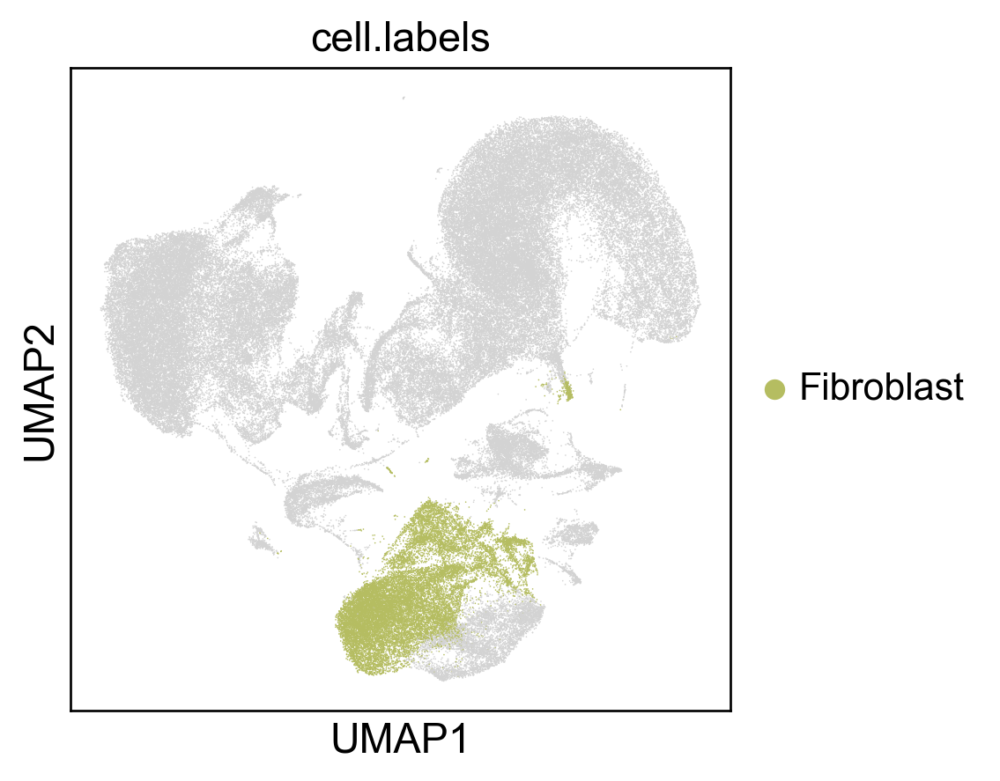

In [25]:
sc.pl.umap(adata, color="cell.labels", groups=["Fibroblast"])

In [26]:
# run snn neighbourhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20) 

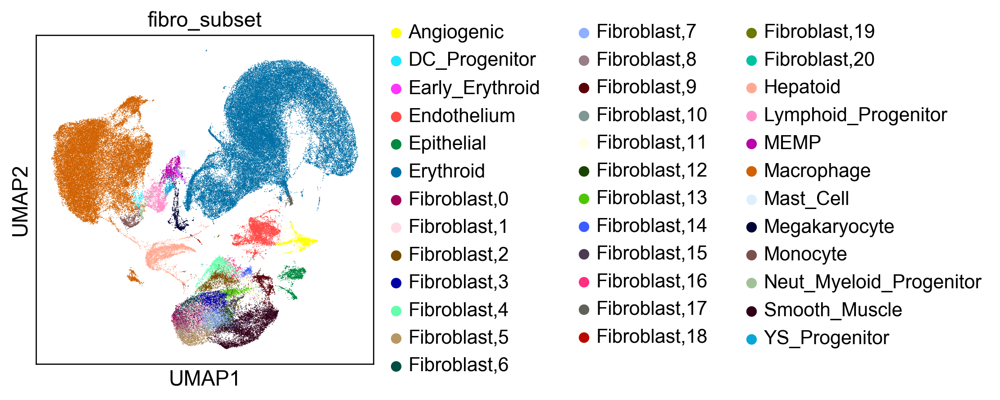

In [27]:
sc.tl.leiden(adata, resolution=1, random_state=26, n_iterations=-1, restrict_to=("cell.labels", ["Fibroblast"]), key_added="fibro_subset")
sc.pl.umap(adata, color="fibro_subset")

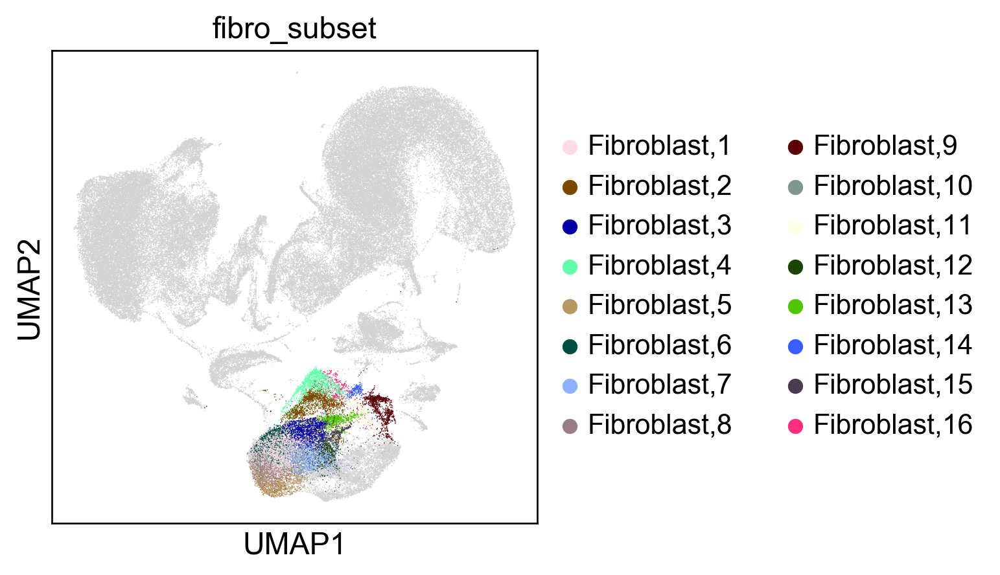

In [28]:
sc.pl.umap(adata, color="fibro_subset", groups=["Fibroblast,1", "Fibroblast,2", "Fibroblast,3", "Fibroblast,4", "Fibroblast,5", "Fibroblast,6", "Fibroblast,7", "Fibroblast,8", "Fibroblast,9", "Fibroblast,10", "Fibroblast,11", "Fibroblast,12", "Fibroblast,13", "Fibroblast,14", "Fibroblast,15", "Fibroblast,16"])

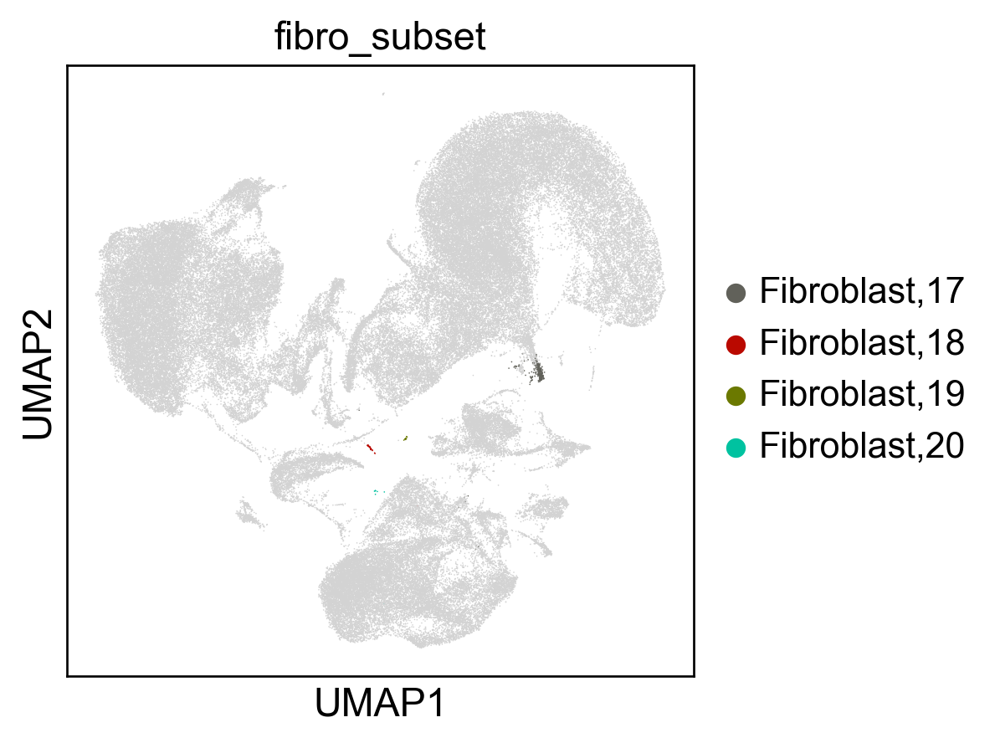

In [29]:
sc.pl.umap(adata, color="fibro_subset", groups=["Fibroblast,17", "Fibroblast,18", "Fibroblast,19", "Fibroblast,20"])

In [30]:
adata.write("/Users/b8058304/Documents/PhD_work/Coding/ys/data/YS_data_YS_paper_post_scrub.h5ad")

# Reloading the data when the kernel dies

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.stats
import anndata
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
# Set up the plot config for viewing the annotation clearly.
sc.settings.set_figure_params(dpi=120, dpi_save=1000)
sc.logging.print_versions()

scanpy==1.4.4 anndata==0.6.22.post1 umap==0.3.7 numpy==1.15.4 scipy==1.3.0 pandas==0.23.4 scikit-learn==0.20.2 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
adata = sc.read('/Users/b8058304/Documents/PhD_work/Coding/ys/data/YS_data_YS_paper_post_scrub.h5ad')

# Subset the fibroblast doublets out

In [4]:
adata.shape

(127083, 26661)

In [5]:
cell_numbers = adata.obs.groupby(["fibro_subset"]).apply(len)
cell_numbers

fibro_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast,0                1975
Fibroblast,1                1958
Fibroblast,2                1686
Fibroblast,3                1584
Fibroblast,4                1442
Fibroblast,5                1337
Fibroblast,6                1306
Fibroblast,7                1279
Fibroblast,8                1248
Fibroblast,9                1059
Fibroblast,10                855
Fibroblast,11                726
Fibroblast,12                717
Fibroblast,13                678
Fibroblast,14                361
Fibroblast,15                338
Fibroblast,16                302
Fibroblast,17                290
Fibroblast,18                 32
Fibroblast,19                 13
Fibroblast,20                  8
Hepatoid                    3447
Lymphoid_Progenitor         1543
MEMP                         9

In [6]:
adata_2 = adata[~adata.obs['fibro_subset'].isin(["Fibroblast,17", "Fibroblast,18", "Fibroblast,19", "Fibroblast,20"])].copy()

In [7]:
cell_numbers = adata_2.obs.groupby(["fibro_subset"]).apply(len)
cell_numbers

fibro_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast,0                1975
Fibroblast,1                1958
Fibroblast,2                1686
Fibroblast,3                1584
Fibroblast,4                1442
Fibroblast,5                1337
Fibroblast,6                1306
Fibroblast,7                1279
Fibroblast,8                1248
Fibroblast,9                1059
Fibroblast,10                855
Fibroblast,11                726
Fibroblast,12                717
Fibroblast,13                678
Fibroblast,14                361
Fibroblast,15                338
Fibroblast,16                302
Hepatoid                    3447
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34925
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     5

In [8]:
adata_2.write("/Users/b8058304/Documents/PhD_work/Coding/ys/data/YS_data_YS_paper_post_scrub.h5ad")

In [9]:
adata = adata_2

# Remove the macrophage near hepatoid

In [10]:
adata

AnnData object with n_obs × n_vars = 126740 × 26661 
    obs: 'n_genes', 'n_counts', 'orig_ident', 'percent_mito', 'fetal_ids', 'sort_ids', 'tissue', 'lanes', 'stages', 'sample_type', 'gender', 'AnnatomicalPart', 'res_30', 'LouvainClustering', 'fullmeta', 'short_code', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'oldanno', 'leiden', 'leiden_sub', 'Hep', 'subcluster_annotation', 'oldanno_2', 'Component', 'cell_labels', 'refined_cell_labels', 'cell.labels', 'fibro_subset'
    var: 'gene.mean', 'gene.dispersion', 'gene.dispersion.scaled'
    uns: 'cell.labels_colors', 'fibro_subset_colors', 'leiden', 'neighbors', 'refined_cell_labels_colors'
    obsm: 'X_fdg', 'X_harmony', 'X_orig.pca', 'X_pca', 'X_pca_prev_1', 'X_tsne', 'X_umap'

In [11]:
adata.shape

(126740, 26661)

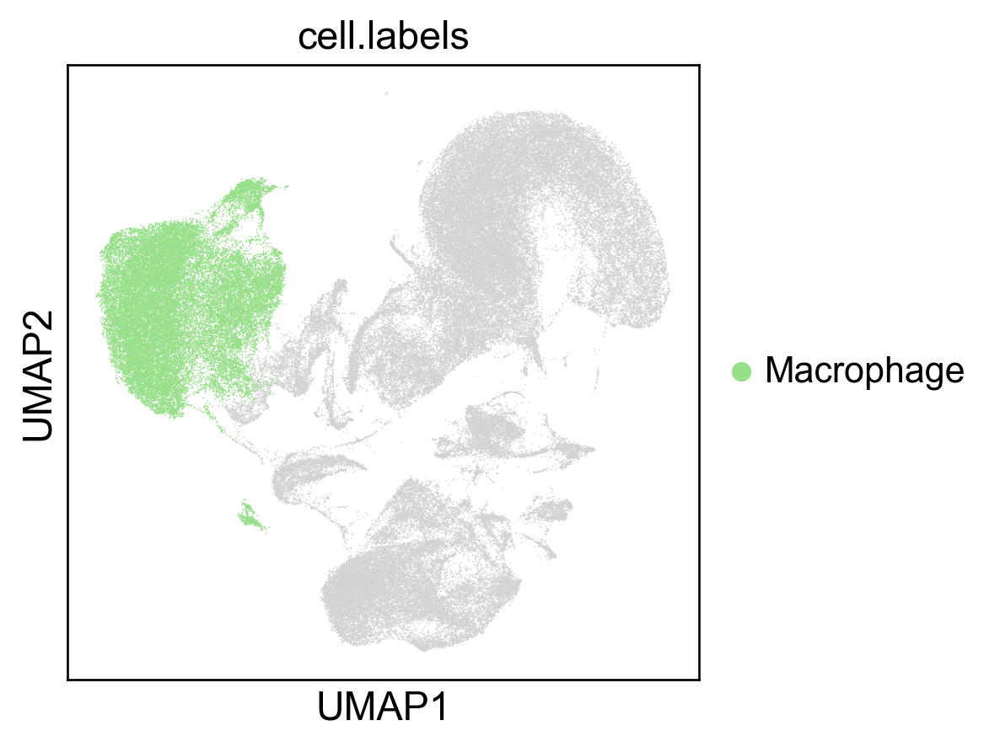

In [12]:
sc.pl.umap(adata, color="cell.labels", groups=["Macrophage"])

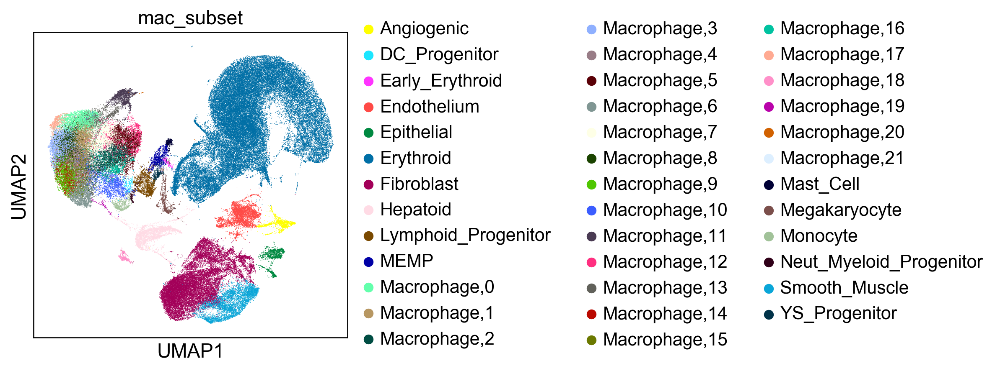

In [13]:
sc.tl.leiden(adata, resolution=1, random_state=26, n_iterations=-1, restrict_to=("cell.labels", ["Macrophage"]), key_added="mac_subset")
sc.pl.umap(adata, color="mac_subset")

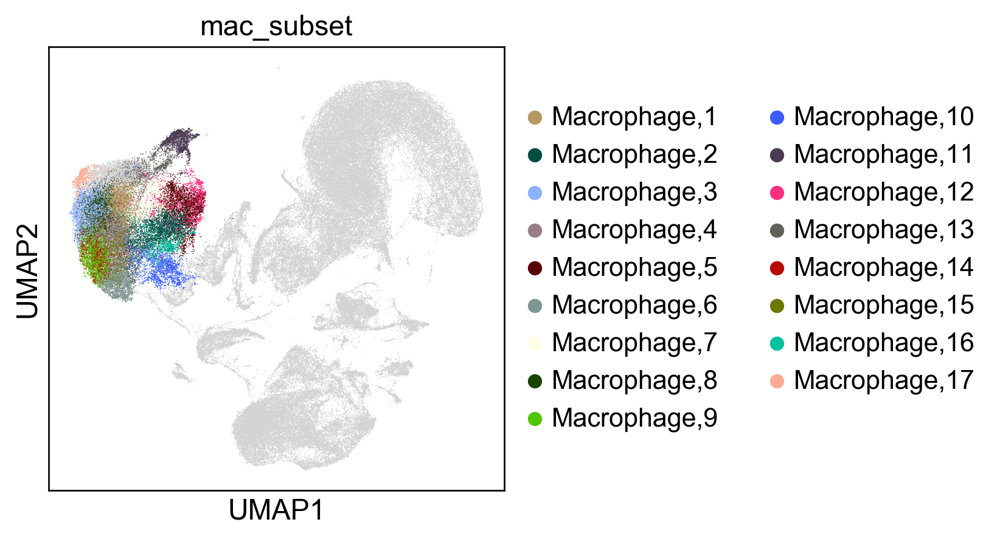

In [14]:
sc.pl.umap(adata, color="mac_subset", groups=["Macrophage,1", "Macrophage,2", "Macrophage,3", "Macrophage,4", "Macrophage,5", "Macrophage,6", "Macrophage,7", "Macrophage,8", "Macrophage,9", "Macrophage,10", "Macrophage,11", "Macrophage,12", "Macrophage,13","Macrophage,14", "Macrophage,15", "Macrophage,16", "Macrophage,17"])

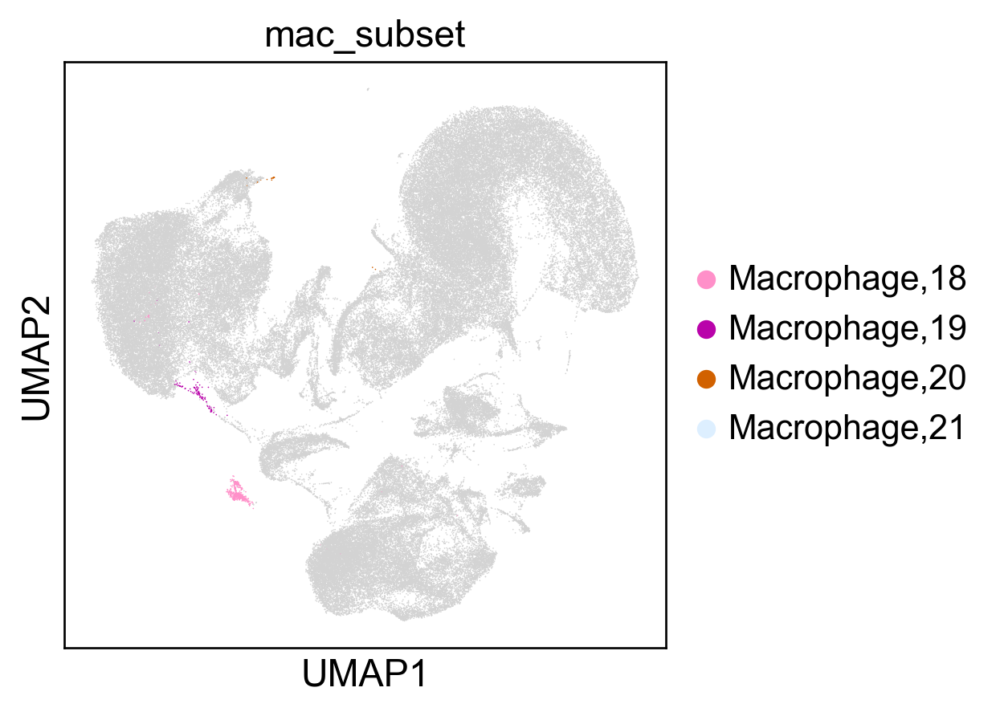

In [15]:
sc.pl.umap(adata, color="mac_subset", groups=["Macrophage,18", "Macrophage,19", "Macrophage,20", "Macrophage,21"])

In [16]:
adata

AnnData object with n_obs × n_vars = 126740 × 26661 
    obs: 'n_genes', 'n_counts', 'orig_ident', 'percent_mito', 'fetal_ids', 'sort_ids', 'tissue', 'lanes', 'stages', 'sample_type', 'gender', 'AnnatomicalPart', 'res_30', 'LouvainClustering', 'fullmeta', 'short_code', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'oldanno', 'leiden', 'leiden_sub', 'Hep', 'subcluster_annotation', 'oldanno_2', 'Component', 'cell_labels', 'refined_cell_labels', 'cell.labels', 'fibro_subset', 'mac_subset'
    var: 'gene.mean', 'gene.dispersion', 'gene.dispersion.scaled'
    uns: 'cell.labels_colors', 'fibro_subset_colors', 'leiden', 'neighbors', 'refined_cell_labels_colors', 'mac_subset_colors'
    obsm: 'X_fdg', 'X_harmony', 'X_orig.pca', 'X_pca', 'X_pca_prev_1', 'X_tsne', 'X_umap'

In [17]:
cell_numbers = adata.obs.groupby(["mac_subset"]).apply(len)
cell_numbers

mac_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 18851
Hepatoid                    3447
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage,0                2963
Macrophage,1                2623
Macrophage,2                2597
Macrophage,3                2520
Macrophage,4                2410
Macrophage,5                2376
Macrophage,6                2215
Macrophage,7                2053
Macrophage,8                2018
Macrophage,9                1890
Macrophage,10               1810
Macrophage,11               1654
Macrophage,12               1526
Macrophage,13               1523
Macrophage,14               1225
Macrophage,15               1152
Macrophage,16               1112
Macrophage,17                710
Macrophage,18                413
Macrophage,19                108

In [18]:
adata_2 = adata[~adata.obs['mac_subset'].isin(["Macrophage,18", "Macrophage,19", "Macrophage,20", "Macrophage,21"])].copy()

In [19]:
cell_numbers = adata_2.obs.groupby(["mac_subset"]).apply(len)
cell_numbers

mac_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 18851
Hepatoid                    3447
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage,0                2963
Macrophage,1                2623
Macrophage,2                2597
Macrophage,3                2520
Macrophage,4                2410
Macrophage,5                2376
Macrophage,6                2215
Macrophage,7                2053
Macrophage,8                2018
Macrophage,9                1890
Macrophage,10               1810
Macrophage,11               1654
Macrophage,12               1526
Macrophage,13               1523
Macrophage,14               1225
Macrophage,15               1152
Macrophage,16               1112
Macrophage,17                710
Mast_Cell                    338
Megakaryocyte                862

In [20]:
adata_2.write("/Users/b8058304/Documents/PhD_work/Coding/ys/data/YS_data_YS_paper_post_scrub.h5ad")

In [21]:
adata = adata_2

# Reloading the data when the kernel dies

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.stats
import anndata
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
# Set up the plot config for viewing the annotation clearly.
sc.settings.set_figure_params(dpi=120, dpi_save=1000)
sc.logging.print_versions()

scanpy==1.4.4 anndata==0.6.22.post1 umap==0.3.7 numpy==1.15.4 scipy==1.3.0 pandas==0.23.4 scikit-learn==0.20.2 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
adata = sc.read('/Users/b8058304/Documents/PhD_work/Coding/ys/data/YS_data_YS_paper_post_scrub.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 126192 × 26661 
    obs: 'n_genes', 'n_counts', 'orig_ident', 'percent_mito', 'fetal_ids', 'sort_ids', 'tissue', 'lanes', 'stages', 'sample_type', 'gender', 'AnnatomicalPart', 'res_30', 'LouvainClustering', 'fullmeta', 'short_code', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'oldanno', 'leiden', 'leiden_sub', 'Hep', 'subcluster_annotation', 'oldanno_2', 'Component', 'cell_labels', 'refined_cell_labels', 'cell.labels', 'fibro_subset', 'mac_subset'
    var: 'gene.mean', 'gene.dispersion', 'gene.dispersion.scaled'
    uns: 'cell.labels_colors', 'fibro_subset_colors', 'leiden', 'mac_subset_colors', 'neighbors', 'refined_cell_labels_colors'
    obsm: 'X_fdg', 'X_harmony', 'X_orig.pca', 'X_pca', 'X_pca_prev_1', 'X_tsne', 'X_umap'

# Remove the three hepatoid "strings" going into mac/fibroblast

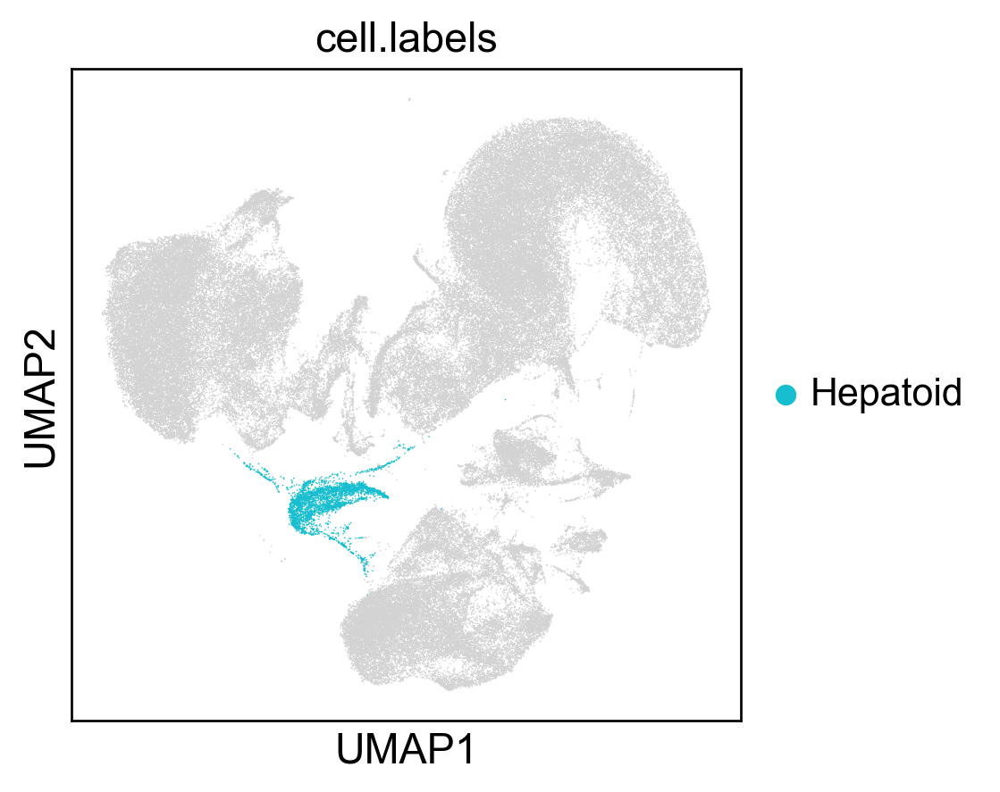

In [5]:
sc.pl.umap(adata, color="cell.labels", groups=["Hepatoid"])

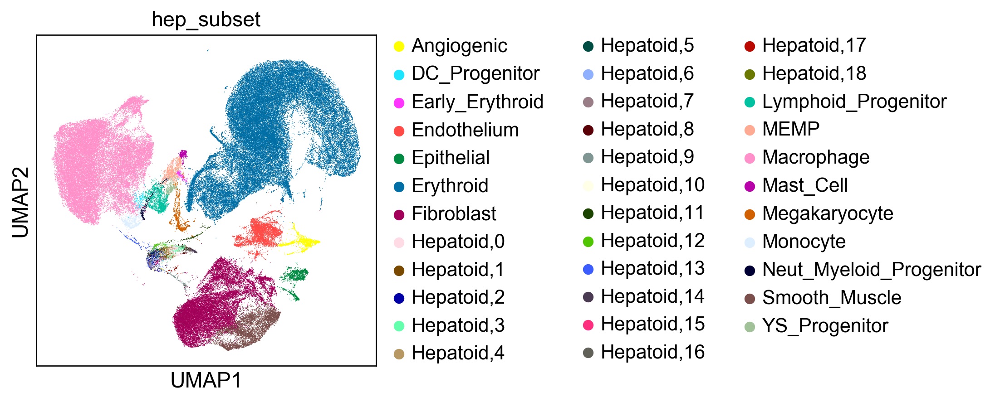

In [6]:
sc.tl.leiden(adata, resolution=1, random_state=26, n_iterations=-1, restrict_to=("cell.labels", ["Hepatoid"]), key_added="hep_subset")
sc.pl.umap(adata, color="hep_subset")

In [7]:
adata.obs["hep_subset"] = adata.obs["hep_subset"].astype('category')
adata.obs["hep_subset"].cat.categories

Index(['Angiogenic', 'DC_Progenitor', 'Early_Erythroid', 'Endothelium',
       'Epithelial', 'Erythroid', 'Fibroblast', 'Hepatoid,0', 'Hepatoid,1',
       'Hepatoid,2', 'Hepatoid,3', 'Hepatoid,4', 'Hepatoid,5', 'Hepatoid,6',
       'Hepatoid,7', 'Hepatoid,8', 'Hepatoid,9', 'Hepatoid,10', 'Hepatoid,11',
       'Hepatoid,12', 'Hepatoid,13', 'Hepatoid,14', 'Hepatoid,15',
       'Hepatoid,16', 'Hepatoid,17', 'Hepatoid,18', 'Lymphoid_Progenitor',
       'MEMP', 'Macrophage', 'Mast_Cell', 'Megakaryocyte', 'Monocyte',
       'Neut_Myeloid_Progenitor', 'Smooth_Muscle', 'YS_Progenitor'],
      dtype='object')

In [8]:
adata.obs["hep_subset"].cat.categories[17]

'Hepatoid,10'

In [9]:
new_colors = np.array(adata.uns["hep_subset_colors"])

new_colors[[17]] = '#a0ffbd' # transitional nk

adata.uns["hep_subset_colors"] = new_colors

new_colors

array(['#FFFF00', '#1CE6FF', '#FF34FF', '#FF4A46', '#008941', '#006FA6',
       '#A30059', '#FFDBE5', '#7A4900', '#0000A6', '#63FFAC', '#B79762',
       '#004D43', '#8FB0FF', '#997D87', '#5A0007', '#809693', '#a0ffbd',
       '#1B4400', '#4FC601', '#3B5DFF', '#4A3B53', '#FF2F80', '#61615A',
       '#BA0900', '#6B7900', '#00C2A0', '#FFAA92', '#FF90C9', '#B903AA',
       '#D16100', '#DDEFFF', '#000035', '#7B4F4B', '#A1C299'], dtype='<U7')

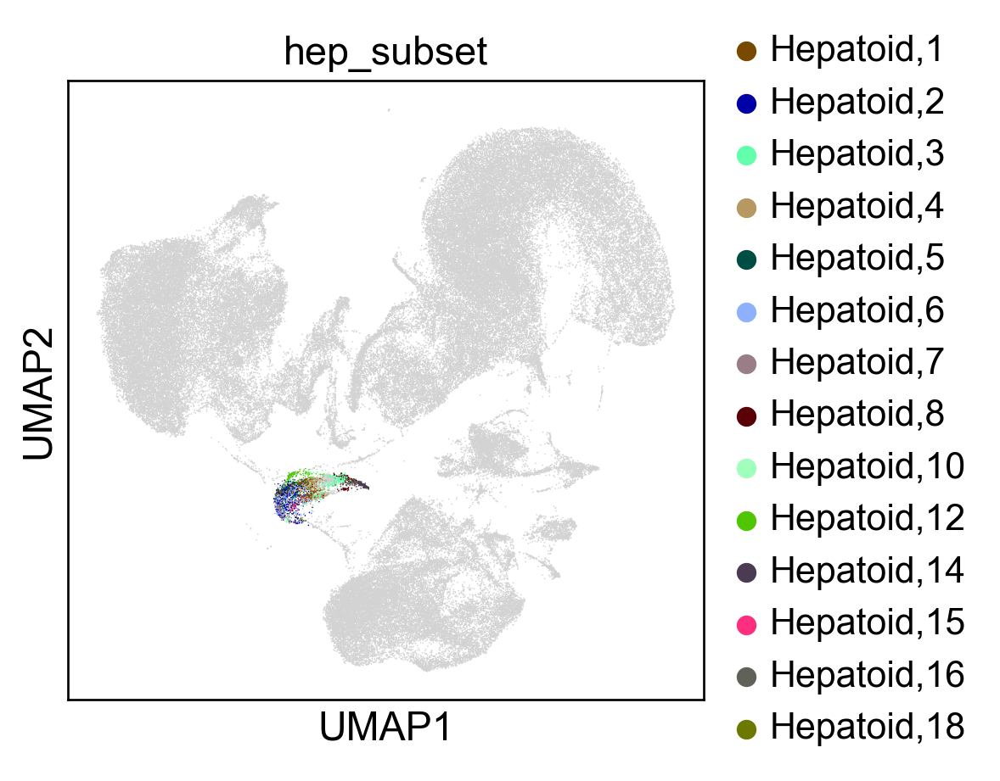

In [10]:
sc.pl.umap(adata, color="hep_subset", groups=["Hepatoid,1", "Hepatoid,2", "Hepatoid,3", "Hepatoid,4", "Hepatoid,5", "Hepatoid,6", "Hepatoid,7", "Hepatoid,8", "Hepatoid,10", "Hepatoid,12", "Hepatoid,14", "Hepatoid,15", "Hepatoid,16", "Hepatoid,18"])

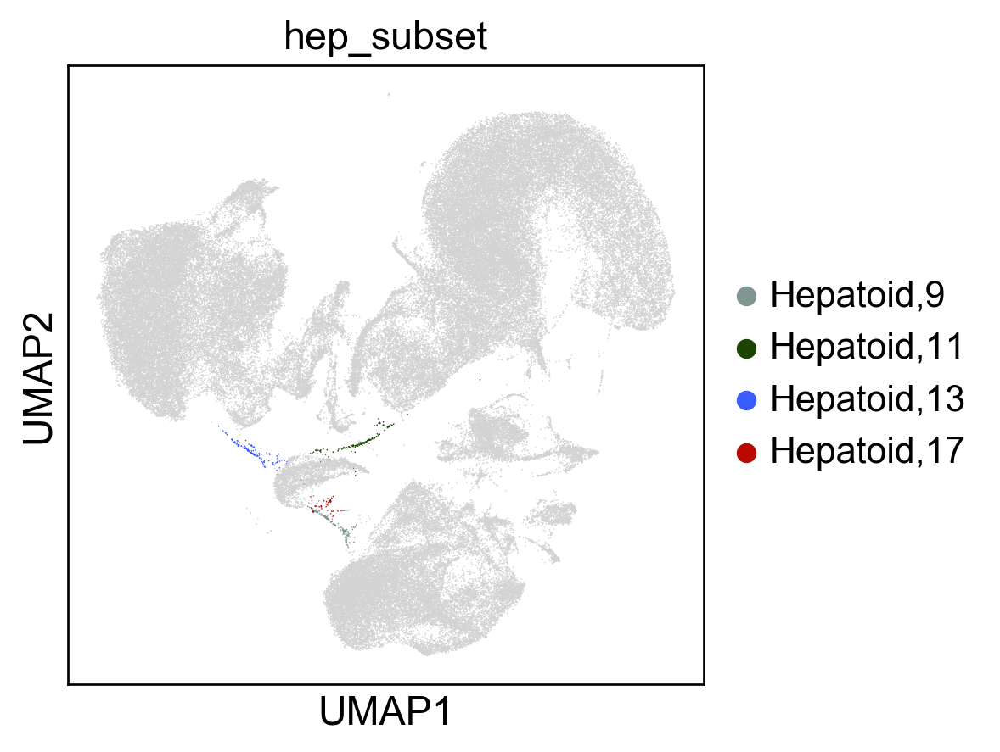

In [11]:
sc.pl.umap(adata, color="hep_subset", groups=["Hepatoid,9", "Hepatoid,11", "Hepatoid,13", "Hepatoid,17"])

In [12]:
adata

AnnData object with n_obs × n_vars = 126192 × 26661 
    obs: 'n_genes', 'n_counts', 'orig_ident', 'percent_mito', 'fetal_ids', 'sort_ids', 'tissue', 'lanes', 'stages', 'sample_type', 'gender', 'AnnatomicalPart', 'res_30', 'LouvainClustering', 'fullmeta', 'short_code', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'oldanno', 'leiden', 'leiden_sub', 'Hep', 'subcluster_annotation', 'oldanno_2', 'Component', 'cell_labels', 'refined_cell_labels', 'cell.labels', 'fibro_subset', 'mac_subset', 'hep_subset'
    var: 'gene.mean', 'gene.dispersion', 'gene.dispersion.scaled'
    uns: 'cell.labels_colors', 'fibro_subset_colors', 'leiden', 'mac_subset_colors', 'neighbors', 'refined_cell_labels_colors', 'hep_subset_colors'
    obsm: 'X_fdg', 'X_harmony', 'X_orig.pca', 'X_pca', 'X_pca_prev_1', 'X_tsne', 'X_umap'

In [13]:
cell_numbers = adata.obs.groupby(["hep_subset"]).apply(len)
cell_numbers

hep_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 18851
Hepatoid,0                   326
Hepatoid,1                   318
Hepatoid,2                   314
Hepatoid,3                   298
Hepatoid,4                   295
Hepatoid,5                   242
Hepatoid,6                   230
Hepatoid,7                   187
Hepatoid,8                   174
Hepatoid,9                   163
Hepatoid,10                  147
Hepatoid,11                  136
Hepatoid,12                  133
Hepatoid,13                  122
Hepatoid,14                  115
Hepatoid,15                  115
Hepatoid,16                   74
Hepatoid,17                   45
Hepatoid,18                   13
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34377
Mast_Cell                    338

In [14]:
adata_2 = adata[~adata.obs['hep_subset'].isin(["Hepatoid,9", "Hepatoid,11", "Hepatoid,13", "Hepatoid,17"])].copy()

In [15]:
cell_numbers = adata_2.obs.groupby(["hep_subset"]).apply(len)
cell_numbers

hep_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 18851
Hepatoid,0                   326
Hepatoid,1                   318
Hepatoid,2                   314
Hepatoid,3                   298
Hepatoid,4                   295
Hepatoid,5                   242
Hepatoid,6                   230
Hepatoid,7                   187
Hepatoid,8                   174
Hepatoid,10                  147
Hepatoid,12                  133
Hepatoid,14                  115
Hepatoid,15                  115
Hepatoid,16                   74
Hepatoid,18                   13
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34377
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     577
Neut_Myeloid_Progenitor      229
Smooth_Muscle               5188

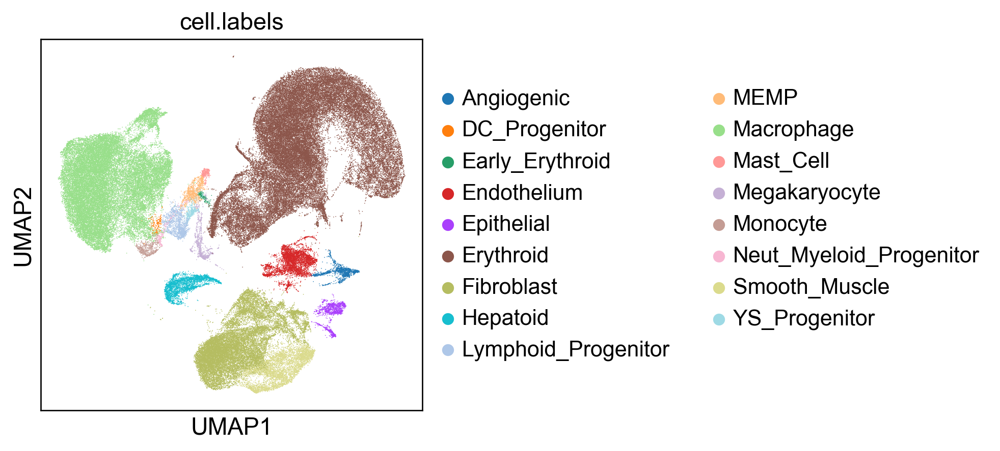

In [16]:
sc.pl.umap(adata_2, color="cell.labels")

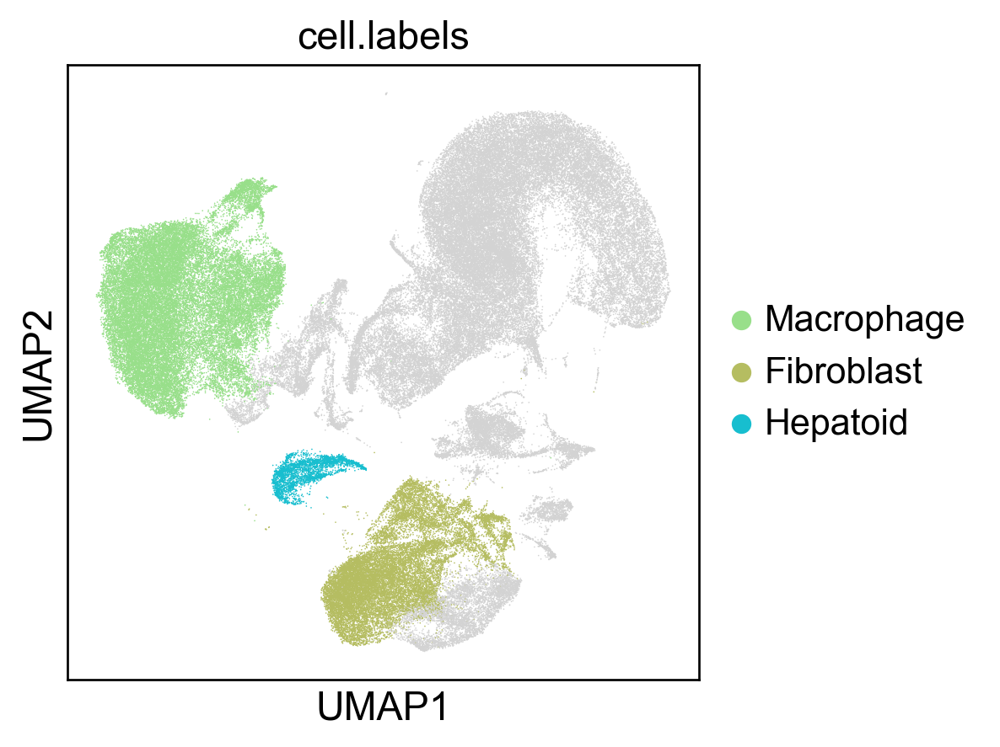

In [17]:
sc.pl.umap(adata_2, color="cell.labels", groups=["Macrophage", "Fibroblast", "Hepatoid"])

# Save the data!

In [18]:
cell_numbers = adata_2.obs.groupby(["hep_subset"]).apply(len)
cell_numbers

hep_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 18851
Hepatoid,0                   326
Hepatoid,1                   318
Hepatoid,2                   314
Hepatoid,3                   298
Hepatoid,4                   295
Hepatoid,5                   242
Hepatoid,6                   230
Hepatoid,7                   187
Hepatoid,8                   174
Hepatoid,10                  147
Hepatoid,12                  133
Hepatoid,14                  115
Hepatoid,15                  115
Hepatoid,16                   74
Hepatoid,18                   13
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34377
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     577
Neut_Myeloid_Progenitor      229
Smooth_Muscle               5188

In [19]:
cell_numbers = adata_2.obs.groupby(["mac_subset"]).apply(len)
cell_numbers

mac_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 18851
Hepatoid                    2981
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage,0                2963
Macrophage,1                2623
Macrophage,2                2597
Macrophage,3                2520
Macrophage,4                2410
Macrophage,5                2376
Macrophage,6                2215
Macrophage,7                2053
Macrophage,8                2018
Macrophage,9                1890
Macrophage,10               1810
Macrophage,11               1654
Macrophage,12               1526
Macrophage,13               1523
Macrophage,14               1225
Macrophage,15               1152
Macrophage,16               1112
Macrophage,17                710
Mast_Cell                    338
Megakaryocyte                862

In [20]:
cell_numbers = adata_2.obs.groupby(["fibro_subset"]).apply(len)
cell_numbers

fibro_subset
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast,0                1975
Fibroblast,1                1958
Fibroblast,2                1686
Fibroblast,3                1584
Fibroblast,4                1442
Fibroblast,5                1337
Fibroblast,6                1306
Fibroblast,7                1279
Fibroblast,8                1248
Fibroblast,9                1059
Fibroblast,10                855
Fibroblast,11                726
Fibroblast,12                717
Fibroblast,13                678
Fibroblast,14                361
Fibroblast,15                338
Fibroblast,16                302
Hepatoid                    2981
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34377
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     5

In [21]:
cell_numbers = adata_2.obs.groupby(["cell.labels"]).apply(len)
cell_numbers

cell.labels
Angiogenic                  1299
DC_Progenitor                178
Early_Erythroid              149
Endothelium                 4259
Epithelial                  1405
Erythroid                  52108
Fibroblast                 18851
Hepatoid                    2981
Lymphoid_Progenitor         1543
MEMP                         971
Macrophage                 34377
Mast_Cell                    338
Megakaryocyte                862
Monocyte                     577
Neut_Myeloid_Progenitor      229
Smooth_Muscle               5188
YS_Progenitor                411
dtype: int64

In [23]:
adata_2.shape

(125726, 26661)

In [22]:
adata_2.write("/Users/b8058304/Documents/PhD_work/Coding/ys/data/YS_data_singlets_raw_20200313.h5ad")

In [24]:
adata_2.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [25]:
adata_2.raw.X

<125726x26661 sparse matrix of type '<class 'numpy.float64'>'
	with 249147629 stored elements in Compressed Sparse Row format>